In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [2]:
!git clone https://github.com/time-series-foundation-models/lag-llama/


Cloning into 'lag-llama'...
remote: Enumerating objects: 319, done.
remote: Counting objects: 100% (157/157), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 319 (delta 111), reused 105 (delta 84), pack-reused 162
Receiving objects: 100% (319/319), 232.35 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (152/152), done.


In [3]:
cd lag-llama

/content/lag-llama


In [4]:
!pip3 install -r requirements.txt --quiet
!huggingface-cli download time-series-foundation-models/Lag-Llama lag-llama.ckpt --local-dir lag-llama

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 87.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 82.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.1/778.1 kB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 38.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.7/67.7 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 65.1 MB/s eta 0:00:00
ERROR: pip's dependency reso

In [5]:
from itertools import islice

from matplotlib import pyplot as plt
import matplotlib.dates as mdates
from tqdm.autonotebook import tqdm

import torch
from gluonts.evaluation import make_evaluation_predictions, Evaluator
from gluonts.dataset.common import ListDataset
import pandas as pd

from lag_llama.gluon.estimator import LagLlamaEstimator

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as poff
import seaborn as sns

from sklearn.metrics import mean_absolute_error

<ipython-input-5-778ed56a89a8>:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
/usr/local/lib/python3.10/dist-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(


In [6]:
# Read data
# ==============================================================================
data_dir = '/content/drive/MyDrive/Python Scripts/Lag Llama experiments/Data'

df = pd.read_csv(data_dir + '/spain_clean.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index(keys = 'datetime', inplace=True)
df = df.asfreq('60min')
df.drop(columns = ['period'], inplace = True)

# Aggregate data to daily frequency - highest observed wave
# ==============================================================================
df = (
    df
    .resample(rule="D", closed="left", label="right")
    .agg({"wave_height": "max"})
)

# Train-test split
# ==============================================================================
one_month = (-1)*30 # One month
two_months = (-1)*60 # Two months

end_val = two_months + one_month
end_train = end_val + two_months + one_month

df_train = df.iloc[:end_train].copy()
df_val = df.iloc[end_train:end_val].copy()
df_test = df.iloc[end_val:].copy()

print(f"Train dates      : {df_train.index.min()} --- {df_train.index.max()}  (n={len(df_train)})")
print(f"Validation dates : {df_val.index.min()} --- {df_val.index.max()}  (n={len(df_val)})")
print(f"Test dates       : {df_test.index.min()} --- {df_test.index.max()}  (n={len(df_test)})")

Train dates      : 2020-06-19 00:00:00 --- 2023-12-22 00:00:00  (n=1282)
Validation dates : 2023-12-23 00:00:00 --- 2024-03-21 00:00:00  (n=90)
Test dates       : 2024-03-22 00:00:00 --- 2024-06-19 00:00:00  (n=90)


In [7]:
def create_gluonts_dataset(df, freq, target_column):
    series = {
        "start": df.index[0],  # start date of the time series
        "target": df[target_column].values,  # target values
    }

    dataset = ListDataset([series], freq=freq)
    return dataset

# Create the GluonTS dataset
train = create_gluonts_dataset(df_train, freq='D', target_column='wave_height')
test = create_gluonts_dataset(df_test, freq='D', target_column='wave_height')
val = create_gluonts_dataset(df_val, freq='D', target_column='wave_height')


print('Train dataset       :', train)
print('Validation dataset  :',val)
print('Test dataset        :',test)

Train dataset       : [{'start': Period('2020-06-19', 'D'), 'target': array([0.87, 0.9 , 0.7 , ..., 1.08, 2.11, 3.07], dtype=float32)}]
Validation dataset  : [{'start': Period('2023-12-23', 'D'), 'target': array([3.4 , 2.99, 1.76, 1.36, 1.4 , 1.14, 1.84, 1.64, 1.18, 3.26, 2.81,
       1.54, 2.77, 2.45, 1.85, 2.2 , 1.59, 1.26, 1.59, 1.64, 1.42, 1.44,
       1.18, 0.58, 0.53, 0.78, 1.14, 2.05, 2.32, 1.47, 1.35, 2.56, 2.11,
       2.16, 1.84, 1.37, 1.89, 1.87, 1.33, 1.84, 1.7 , 1.13, 1.81, 1.55,
       1.79, 1.79, 1.39, 1.05, 1.25, 1.13, 3.99, 3.97, 3.43, 1.39, 1.31,
       1.36, 1.26, 1.28, 1.23, 1.18, 1.48, 2.21, 4.24, 4.27, 4.42, 3.89,
       5.36, 4.54, 2.21, 3.42, 3.47, 3.53, 2.38, 2.44, 2.33, 2.13, 1.5 ,
       1.8 , 1.67, 3.47, 2.45, 1.46, 1.18, 0.81, 0.73, 0.73, 0.74, 0.96,
       1.17, 1.1 ], dtype=float32)}]
Test dataset        : [{'start': Period('2024-03-22', 'D'), 'target': array([1.24, 1.6 , 1.87, 2.27, 2.09, 2.18, 3.25, 3.19, 2.44, 1.59, 1.28,
       1.94, 1.64, 0.8 , 1.1 ,

We create a function for Lag-Llama inference that we can reuse. This function returns the predictions for the given prediction horizon. The forecast will be of shape (num_samples, prediction_length), where `num_samples` is the number of samples sampled from the predicted probability distribution for each timestep.

In [ ]:
# def get_lag_llama_predictions(dataset, prediction_length, context_length=32, num_samples=20, device="cpu", batch_size=1, nonnegative_pred_samples=True):
#     ckpt = torch.load("lag-llama/lag-llama.ckpt", map_location=torch.device(device))
#     estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

#     estimator = LagLlamaEstimator(
#         # ckpt_path="lag-llama.ckpt",
#         ckpt_path = 'lag-llama/lag-llama.ckpt',
#         prediction_length=prediction_length,
#         context_length=context_length,
#         device = device,

#         # estimator args
#         input_size=estimator_args["input_size"],
#         n_layer=estimator_args["n_layer"],
#         n_embd_per_head=estimator_args["n_embd_per_head"],
#         n_head=estimator_args["n_head"],
#         scaling=estimator_args["scaling"],
#         time_feat=estimator_args["time_feat"],

#         nonnegative_pred_samples=nonnegative_pred_samples,

#         # linear positional encoding scaling
#         rope_scaling={
#             "type": "linear",
#             "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
#         },

#         batch_size=batch_size,
#         num_parallel_samples=num_samples,
#     )

#     lightning_module = estimator.create_lightning_module().to(device)
#     transformation = estimator.create_transformation()
#     predictor = estimator.create_predictor(transformation, lightning_module)

#     forecast_it, ts_it = make_evaluation_predictions(
#         dataset=dataset,
#         predictor=predictor,
#         num_samples=num_samples
#     )
#     forecasts = list(tqdm(forecast_it, total=len(dataset[0]['target']), desc="Forecasting batches"))
#     tss = list(tqdm(ts_it, total=len(dataset[0]['target']), desc="Ground truth"))

#     return forecasts, tss

## Fine-tuning

Let us fine-tune the Lag-Llama base model with a few data-specific changes. Feel Free to change the hyperparameters below:

In [ ]:
# # Forecast parameters
# prediction_length = 24
# context_length = 32
# num_samples = 50
# device = torch.device('cuda')

In [ ]:
# # Model definition
# ckpt = torch.load("lag-llama/lag-llama.ckpt", map_location=device)
# estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

# estimator = LagLlamaEstimator(
#         ckpt_path="lag-llama/lag-llama.ckpt",
#         prediction_length=prediction_length,
#         context_length=context_length,
#         device = device,

#         # distr_output="neg_bin",
#         # scaling="mean",
#         nonnegative_pred_samples=True,
#         aug_prob=0,
#         lr=5e-4,

#         # estimator args
#         input_size=estimator_args["input_size"],
#         n_layer=estimator_args["n_layer"],
#         n_embd_per_head=estimator_args["n_embd_per_head"],
#         n_head=estimator_args["n_head"],
#         time_feat=estimator_args["time_feat"],

#         rope_scaling={
#             "type": "linear",
#             "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
#         },

#         batch_size=1,
#         num_parallel_samples=num_samples,
#         trainer_kwargs = {"max_epochs": 50,}, # <- lightning trainer arguments
#     )

In [ ]:
# Train
# predictor = estimator.train(training_data = train, validation_data = val, cache_data=True, shuffle_buffer_length=1000)

In [8]:
context_lengths = [16, 32, 64]
# context_lengths = [32, 64, 128, 256]
learning_rates = [1e-3, 5e-4, 1e-4]
prediction_length = 7
device = torch.device('cuda')
num_samples = 50

results = []

for context_length in context_lengths:
    for lr in learning_rates:
        # Model definition
        ckpt = torch.load("lag-llama/lag-llama.ckpt", map_location=device)
        estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

        estimator = LagLlamaEstimator(
                ckpt_path="lag-llama/lag-llama.ckpt",
                prediction_length=prediction_length,
                context_length=context_length,
                device = device,

                # distr_output="neg_bin",
                # scaling="mean",
                nonnegative_pred_samples=True,
                aug_prob=0,
                lr=lr,

                # estimator args
                input_size=estimator_args["input_size"],
                n_layer=estimator_args["n_layer"],
                n_embd_per_head=estimator_args["n_embd_per_head"],
                n_head=estimator_args["n_head"],
                time_feat=estimator_args["time_feat"],

                # rope_scaling={
                #     "type": "linear",
                #     "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
                # },

                batch_size=64,
                num_parallel_samples=num_samples,
                trainer_kwargs = {"max_epochs": 15,}, # <- lightning trainer arguments
            )

        # Train
        predictor = estimator.train(training_data = train, validation_data = val, cache_data=True, shuffle_buffer_length=1000)

        # Evaluate the model
        forecast_it, ts_it = make_evaluation_predictions(
            dataset=test,
            predictor=predictor,
            num_samples=num_samples
        )
        forecasts = list(forecast_it)
        tss = list(ts_it)
        evaluator = Evaluator()
        agg_metrics, _ = evaluator(iter(tss), iter(forecasts), num_series=len(test))

        # Store results
        results.append({
            'context_length': context_length,
            'lr': lr,
            # 'MAE': agg_metrics['mean_wQuantileLoss']
            'Coverage[0.8]': agg_metrics['Coverage[0.8]'],
            'Coverage[0.9]': agg_metrics['Coverage[0.9]'],
            'MAE_Coverage': agg_metrics['MAE_Coverage']
        })

# Print or analyze the results to find the best hyperparameters
print(results)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.20363 (best 1.20363), saving model to '/content/lag-llama/lightning_logs/version_0/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.20363 (best 1.20363), saving model to '/content/lag-llama/lightning_logs/version_0/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 38.77it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.20462 (best 1.20462), saving model to '/content/lag-llama/lightning_logs/version_1/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.20462 (best 1.20462), saving model to '/content/lag-llama/lightning_logs/version_1/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 31.56it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.43787 (best 1.43787), saving model to '/content/lag-llama/lightning_logs/version_2/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.43787 (best 1.43787), saving model to '/content/lag-llama/lightning_logs/version_2/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 40.80it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.22794 (best 1.22794), saving model to '/content/lag-llama/lightning_logs/version_3/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.22794 (best 1.22794), saving model to '/content/lag-llama/lightning_logs/version_3/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 41.17it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.30294 (best 1.30294), saving model to '/content/lag-llama/lightning_logs/version_4/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.30294 (best 1.30294), saving model to '/content/lag-llama/lightning_logs/version_4/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 36.88it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.43424 (best 1.43424), saving model to '/content/lag-llama/lightning_logs/version_5/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.43424 (best 1.43424), saving model to '/content/lag-llama/lightning_logs/version_5/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 40.86it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.00495 (best 1.00495), saving model to '/content/lag-llama/lightning_logs/version_6/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.00495 (best 1.00495), saving model to '/content/lag-llama/lightning_logs/version_6/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 30.20it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 0.98749 (best 0.98749), saving model to '/content/lag-llama/lightning_logs/version_7/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 0.98749 (best 0.98749), saving model to '/content/lag-llama/lightning_logs/version_7/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 35.87it/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 50: 'val_loss' reached 1.10307 (best 1.10307), saving model to '/content/lag-llama/lightning_logs/version_8/checkpoints/epoch=0-step=50.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 50: 'val_loss' reached 1.10307 (best 1.10307), saving model to '/content/lag-llama/lightning_logs/version_8/checkpoints/epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 100: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 150: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 200: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 250: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 300: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 350: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 400: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 450: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 500: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 550: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 11, global step 600: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 12, global step 650: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 13, global step 700: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 14, global step 750: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 14, global step 750: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.
Running evaluation: 100%|██████████| 1/1 [00:00<00:00, 33.39it/s]


[{'context_length': 16, 'lr': 0.001, 'Coverage[0.8]': 1.0, 'Coverage[0.9]': 1.0, 'MAE_Coverage': 0.5}, {'context_length': 16, 'lr': 0.0005, 'Coverage[0.8]': 0.8571428571428571, 'Coverage[0.9]': 1.0, 'MAE_Coverage': 0.5}, {'context_length': 16, 'lr': 0.0001, 'Coverage[0.8]': 0.7142857142857143, 'Coverage[0.9]': 0.8571428571428571, 'MAE_Coverage': 0.36666666666666664}, {'context_length': 32, 'lr': 0.001, 'Coverage[0.8]': 1.0, 'Coverage[0.9]': 1.0, 'MAE_Coverage': 0.5}, {'context_length': 32, 'lr': 0.0005, 'Coverage[0.8]': 0.5714285714285714, 'Coverage[0.9]': 1.0, 'MAE_Coverage': 0.5}, {'context_length': 32, 'lr': 0.0001, 'Coverage[0.8]': 1.0, 'Coverage[0.9]': 1.0, 'MAE_Coverage': 0.5}, {'context_length': 64, 'lr': 0.001, 'Coverage[0.8]': 0.7142857142857143, 'Coverage[0.9]': 0.7142857142857143, 'MAE_Coverage': 0.2746031746031746}, {'context_length': 64, 'lr': 0.0005, 'Coverage[0.8]': 0.5714285714285714, 'Coverage[0.9]': 0.8571428571428571, 'MAE_Coverage': 0.36666666666666664}, {'context_l

In [9]:
results

[{'context_length': 16,
  'lr': 0.001,
  'Coverage[0.8]': 1.0,
  'Coverage[0.9]': 1.0,
  'MAE_Coverage': 0.5},
 {'context_length': 16,
  'lr': 0.0005,
  'Coverage[0.8]': 0.8571428571428571,
  'Coverage[0.9]': 1.0,
  'MAE_Coverage': 0.5},
 {'context_length': 16,
  'lr': 0.0001,
  'Coverage[0.8]': 0.7142857142857143,
  'Coverage[0.9]': 0.8571428571428571,
  'MAE_Coverage': 0.36666666666666664},
 {'context_length': 32,
  'lr': 0.001,
  'Coverage[0.8]': 1.0,
  'Coverage[0.9]': 1.0,
  'MAE_Coverage': 0.5},
 {'context_length': 32,
  'lr': 0.0005,
  'Coverage[0.8]': 0.5714285714285714,
  'Coverage[0.9]': 1.0,
  'MAE_Coverage': 0.5},
 {'context_length': 32,
  'lr': 0.0001,
  'Coverage[0.8]': 1.0,
  'Coverage[0.9]': 1.0,
  'MAE_Coverage': 0.5},
 {'context_length': 64,
  'lr': 0.001,
  'Coverage[0.8]': 0.7142857142857143,
  'Coverage[0.9]': 0.7142857142857143,
  'MAE_Coverage': 0.2746031746031746},
 {'context_length': 64,
  'lr': 0.0005,
  'Coverage[0.8]': 0.5714285714285714,
  'Coverage[0.9]': 

In [ ]:
# forecast_it, ts_it = make_evaluation_predictions(
#         dataset=test,
#         predictor=predictor,
#         num_samples=num_samples
#     )

# forecasts = list(tqdm(forecast_it, total=len(df_test), desc="Forecasting batches"))
# tss = list(tqdm(ts_it, total=len(df_test), desc="Ground truth"))

Forecasting batches:   0%|          | 0/1440 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1440 [00:00<?, ?it/s]

In [ ]:
# import os
# files = range(0,12,1)
# models = []
# for file in files:
#   directory_path = f'/content/lag-llama/lightning_logs/version_{file}/checkpoints'
#   with os.scandir(directory_path) as entries:
#     for entry in entries:
#         # Check if it's a file
#         if entry.is_file():
#             print(entry.name)
#             models.append(entry.name)


epoch=43-step=2200.ckpt
epoch=33-step=1700.ckpt
epoch=19-step=1000.ckpt
epoch=40-step=2050.ckpt
epoch=39-step=2000.ckpt
epoch=20-step=1050.ckpt
epoch=46-step=2350.ckpt
epoch=42-step=2150.ckpt
epoch=30-step=1550.ckpt
epoch=41-step=2100.ckpt
epoch=31-step=1600.ckpt
epoch=29-step=1500.ckpt


In [10]:
def get_lag_llama_predictions(dataset,
                                model_ckpt,
                                prediction_length = 24,
                                context_length=None,
                                num_samples=100,
                                device="cuda",
                                batch_size=64,
                                nonnegative_pred_samples=True):


    _device = torch.device(device)
    _ckpt = torch.load(model_ckpt, map_location=_device)
    estimator_args = _ckpt["hyper_parameters"]["model_kwargs"]
    if context_length == None:
      context_length=estimator_args['context_length']

    estimator = LagLlamaEstimator(
        # ckpt_path="lag-llama.ckpt",
        ckpt_path = model_ckpt,
        context_length=context_length,
        prediction_length=prediction_length,
        device = _device,

        # estimator args
        input_size=estimator_args["input_size"],
        n_layer=estimator_args["n_layer"],
        n_embd_per_head=estimator_args["n_embd_per_head"],
        n_head=estimator_args["n_head"],
        scaling=estimator_args["scaling"],
        time_feat=estimator_args["time_feat"],

        nonnegative_pred_samples=nonnegative_pred_samples,

        # linear positional encoding scaling
        # rope_scaling={
        #     "type": "linear",
        #     "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
        # },

        batch_size=batch_size,
        num_parallel_samples=num_samples,
    )

    lightning_module = estimator.create_lightning_module().to(device)
    transformation = estimator.create_transformation()
    predictor = estimator.create_predictor(transformation, lightning_module)

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=dataset,
        predictor=predictor,
        num_samples=num_samples
    )
    forecasts = list(tqdm(forecast_it, total=len(dataset[0]['target']), desc="Forecasting batches"))
    tss = list(tqdm(ts_it, total=len(dataset[0]['target']), desc="Ground truth"))

    return forecasts, tss

In [11]:
def plot_preds(model_dir, title):
  forecasts, tss = get_lag_llama_predictions(
      test,
      model_ckpt = model_dir,
      prediction_length=24,
      num_samples=num_samples,
      # context_length=context_length,
      device=torch.device('cuda')
    )

  plt.figure(figsize=(20, 15))
  date_formater = mdates.DateFormatter('%b, %d')
  plt.rcParams.update({'font.size': 15})

  # Iterate through the first 9 series, and plot the predicted samples
  for idx, (forecast, ts) in islice(enumerate(zip(forecasts, tss)), 9):
      ax = plt.subplot(3, 3, idx+1)

      plt.plot(ts[-4 * prediction_length:].to_timestamp(), label="target", )
      forecast.plot( color='g')
      plt.xticks(rotation=60)
      ax.xaxis.set_major_formatter(date_formater)
      ax.set_title(forecast.item_id)

  plt.gcf().tight_layout()
  plt.title(title)
  plt.legend()
  plt.show()

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

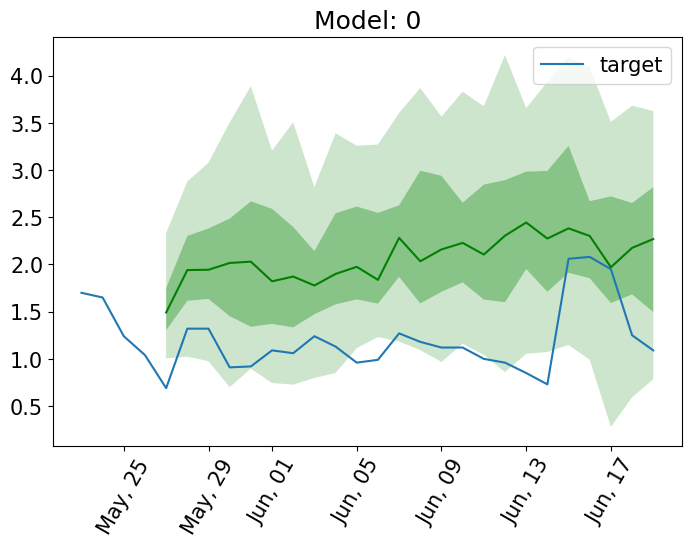

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

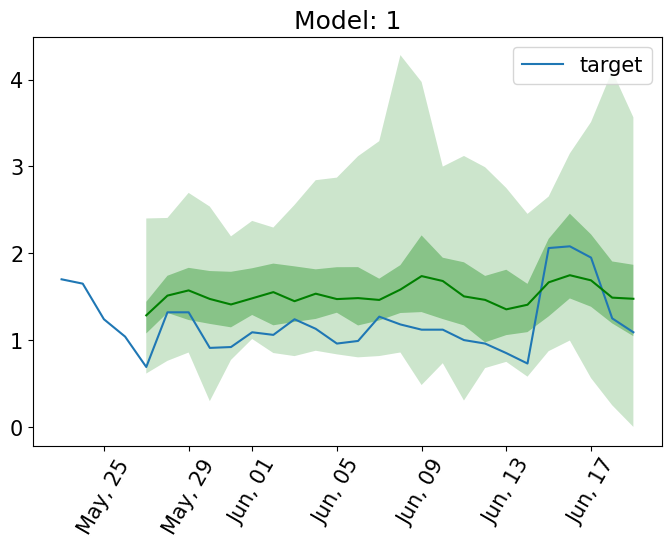

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

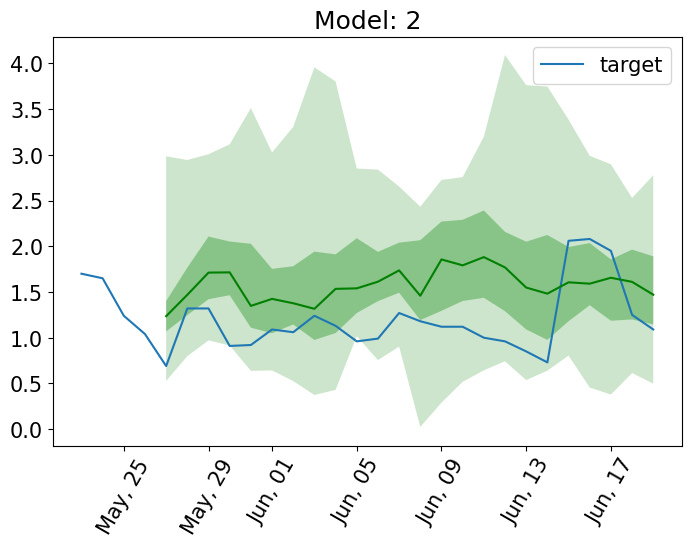

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

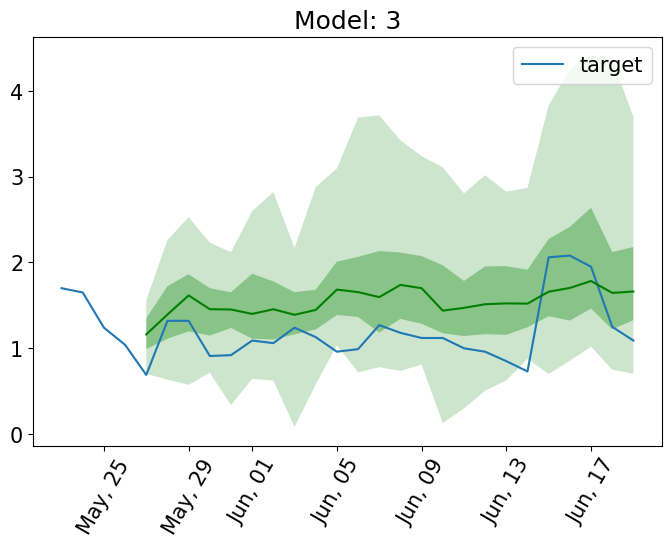

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

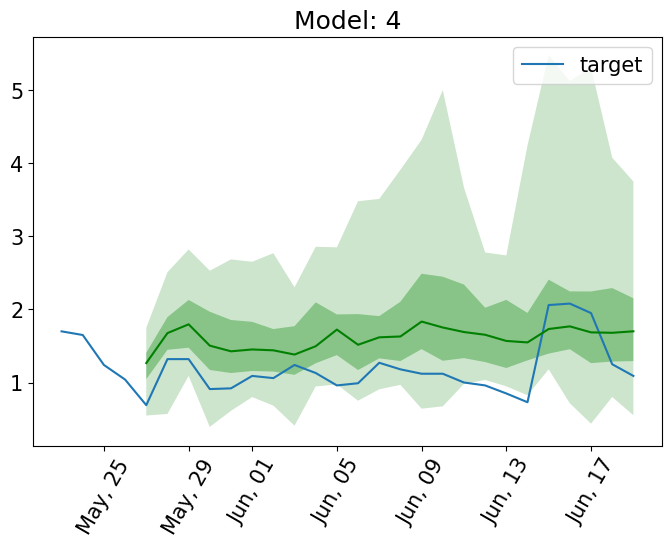

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

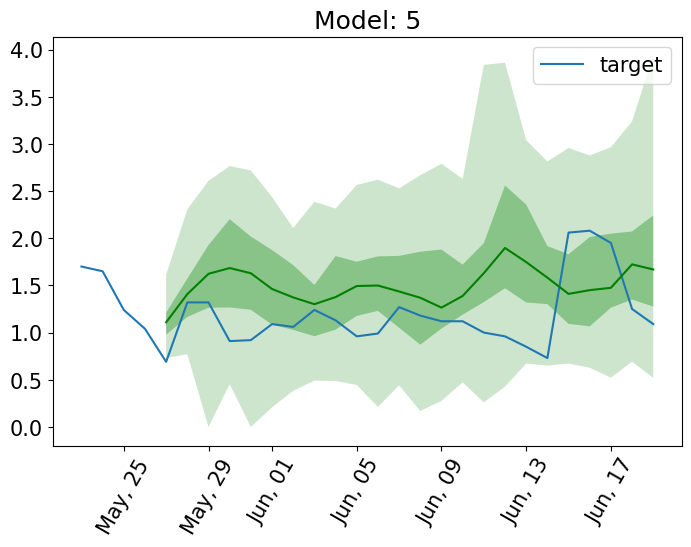

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

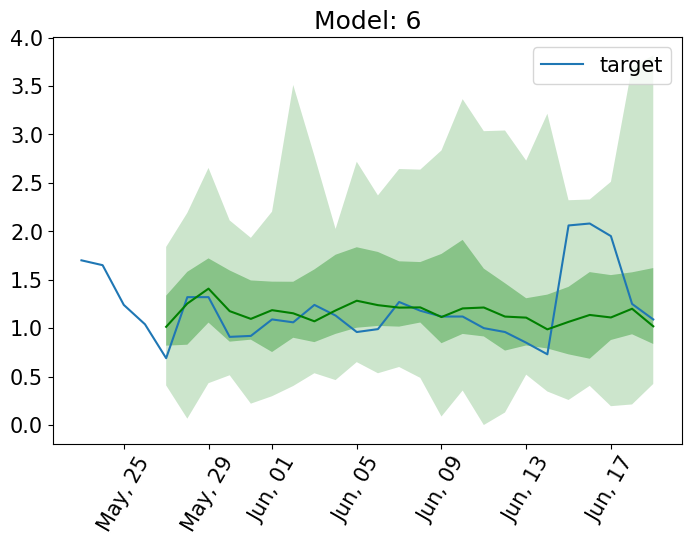

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

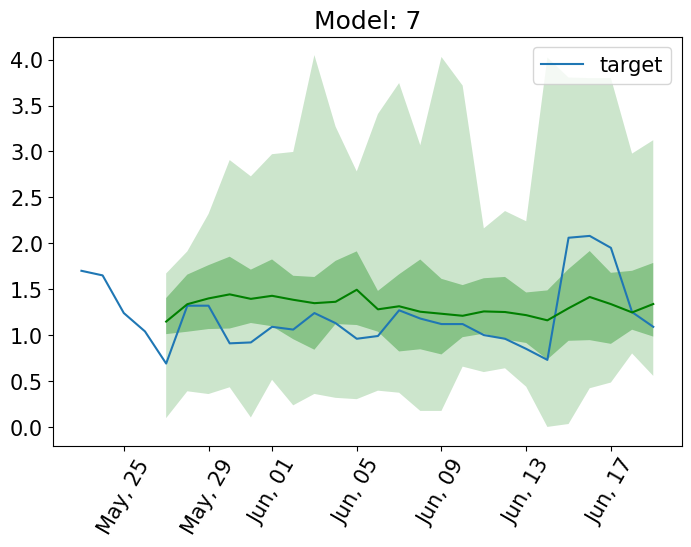

Forecasting batches:   0%|          | 0/90 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/90 [00:00<?, ?it/s]

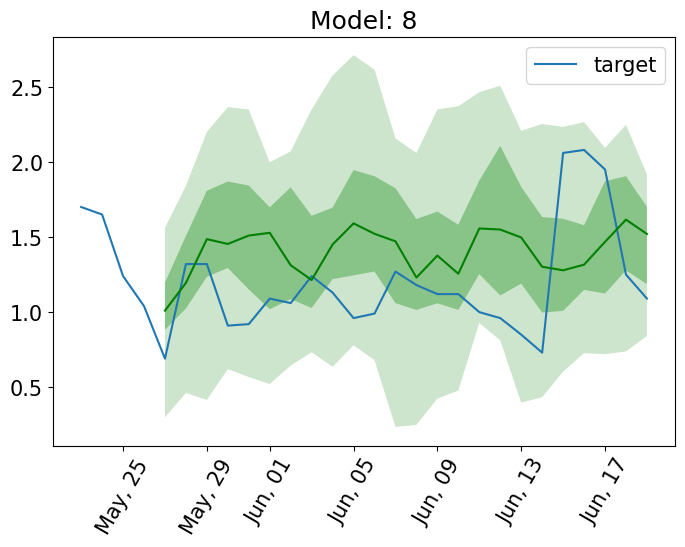

FileNotFoundError: [Errno 2] No such file or directory: '/content/lag-llama/lightning_logs/version_9/checkpoints'

In [12]:
import os
files = range(0,12,1)
for file in files:
  directory_path = f'/content/lag-llama/lightning_logs/version_{file}/checkpoints'
  with os.scandir(directory_path) as entries:
    for entry in entries:
        # Check if it's a file
        if entry.is_file():
          model_dir = directory_path + '/' + entry.name
          plot_preds(model_dir, 'Model: '+ str(file))


In [ ]:
def recursive_forecast(
    model_ckpt,
    context_df,
    test_df,
    prediction_length = 24,
    context_length = None,
    device = 'cuda',
    num_samples = 100):

    context_gdf = create_gluonts_dataset(context_df, freq='1H', target_column='wave_height')

    _device = torch.device(device)

    batch_size = prediction_length  # Number of observations to add to context at each step of the forecast. Same as prediction length.
    total_length = len(df_test)  # Total length of the target DataFrame
    if context_length == None:
      context_length=estimator_args['context_length']

    all_point_forecasts = []

    # Append batches sequentially to the target DataFrame
    for i in range(0, total_length, batch_size):

        # Prediction based on context dataset
        forecasts, tss = get_lag_llama_predictions(
        model_ckpt = model_ckpt,
        dataset = context_gdf,
        prediction_length=prediction_length,
        num_samples=num_samples,
        context_length=context_length,
        device=_device
        )

        point_forecast = list(forecasts[0].mean)
        all_point_forecasts.extend(point_forecast)

        # Update context dataset
        batch_start_index = i
        batch_end_index = min(i + batch_size, total_length)  # Ensure not to exceed the length of target_df
        batch = test_df.iloc[batch_start_index:batch_end_index]
        context_df = pd.concat([context_df, batch], ignore_index=False)
        context_gdf = create_gluonts_dataset(context_df, freq='1H', target_column='wave_height')

    test_n_preds_df = test_df.copy()
    test_n_preds_df['forecasts'] = all_point_forecasts

    return test_n_preds_df


In [ ]:
def plot_backtest_preds(df_actual_pred, actual_col, pred_col):
    fig = go.Figure()
    trace1 = go.Scatter(x=df_actual_pred.index, y=df_actual_pred[actual_col], name="actual", mode="lines")
    trace2 = go.Scatter(x=df_actual_pred.index, y=df_actual_pred[pred_col], name="prediction", mode="lines")
    fig.add_trace(trace1)
    fig.add_trace(trace2)
    fig.update_layout(
        title="Actual value vs predicted in test data",
        xaxis_title="Date time",
        yaxis_title="Wave height (meters)",
        width=800,
        height=400,
        margin=dict(l=20, r=20, t=35, b=20),
        legend=dict(
            orientation="h",
            yanchor="top",
            y=1.1,
            xanchor="left",
            x=0.001
        )
    )

    fig.show()

In [ ]:
import os
files = range(0,12,1)
for file in files:
  directory_path = f'/content/lag-llama/lightning_logs/version_{file}/checkpoints'
  with os.scandir(directory_path) as entries:
    for entry in entries:
        # Check if it's a file
        if entry.is_file():
          model_dir = directory_path + '/' + entry.name
          # Produce forecasts
          df_forecasts = recursive_forecast(model_ckpt = model_dir, context_df=df_train[-256:], test_df = df_test)
          # Plot
          print('---------------------------------------------------------------')
          print('Model: '+ str(file))
          plot_backtest_preds(df_forecasts, 'wave_height', 'forecasts')

Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 0


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 1


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 2


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 3


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 4


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 5


Forecasting batches:   0%|          | 0/256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/448 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/472 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/472 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/496 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/496 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/520 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/520 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/544 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/544 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/568 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/568 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/592 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/592 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/616 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/616 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/640 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/640 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/664 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/664 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/688 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/688 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/712 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/712 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/736 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/736 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/760 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/760 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/784 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/784 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/808 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/808 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/832 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/832 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/856 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/856 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/880 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/880 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/904 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/904 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/928 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/928 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/952 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/952 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/976 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/976 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1000 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1000 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1024 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1024 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1048 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1048 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1072 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1072 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1096 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1096 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1120 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1120 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1144 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1144 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1168 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1168 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1192 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1192 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1216 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1216 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1240 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1240 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1264 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1264 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1288 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1288 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1312 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1312 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1336 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1336 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1360 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1360 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1384 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1384 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1408 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1408 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1432 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1432 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1456 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1456 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1480 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1480 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1504 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1504 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1528 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1528 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1552 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1552 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1576 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1576 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1600 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1600 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1624 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1624 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1648 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1648 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1672 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1672 [00:00<?, ?it/s]

---------------------------------------------------------------
Model: 6


# !!Need to adjust 👇!!


In [ ]:
# Recursive multi-step forecasting
# ==============================================================================
batch_size = 24  # Number of observations per batch
total_length = len(df_test)  # Total length of the target DataFrame

prediction_length = batch_size
context_length = 32
num_samples = 100
device = torch.device('cuda')

context_df = df_train[-context_length:]
context_gdf = create_gluonts_dataset(context_df, freq='1H', target_column='wave_height')

all_point_forecasts = []

# Append batches sequentially to the target DataFrame
for i in range(0, total_length, batch_size):

    # Prediction based on context dataset
    # forecasts, tss = get_lag_llama_predictions(
    # context_gdf,
    # prediction_length=prediction_length,
    # num_samples=num_samples,
    # context_length=context_length,
    # device=device
    # )

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=context_gdf,
        predictor=predictor,
        num_samples=num_samples
    )

    forecasts = list(tqdm(forecast_it, total=len(context_df), desc="Forecasting batches"))
    tss = list(tqdm(ts_it, total=len(context_df), desc="Ground truth"))

    point_forecast = list(forecasts[0].mean)
    all_point_forecasts.extend(point_forecast)

    # Update context dataset
    batch_start_index = i
    batch_end_index = min(i + batch_size, total_length)  # Ensure not to exceed the length of target_df
    batch = df_test.iloc[batch_start_index:batch_end_index]
    context_df = pd.concat([context_df, batch], ignore_index=False)
    context_gdf = create_gluonts_dataset(context_df, freq='1H', target_column='wave_height')


Forecasting batches:   0%|          | 0/32 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/32 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/56 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/56 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/80 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/80 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/104 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/104 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/128 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/128 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/152 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/152 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/176 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/176 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/200 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/200 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/224 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/224 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/248 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/248 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/272 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/272 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/296 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/296 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/320 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/320 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/344 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/344 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/368 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/368 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/392 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/392 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/416 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/416 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/440 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/440 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/464 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/464 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/488 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/488 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/512 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/512 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/536 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/536 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/560 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/560 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/584 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/584 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/608 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/608 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/632 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/632 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/656 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/656 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/680 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/680 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/704 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/704 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/728 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/728 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/752 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/752 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/776 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/776 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/800 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/800 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/824 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/824 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/848 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/848 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/872 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/872 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/896 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/896 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/920 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/920 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/944 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/944 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/968 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/968 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/992 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/992 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1016 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1016 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1040 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1040 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1064 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1064 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1088 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1088 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1112 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1112 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1136 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1136 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1160 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1160 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1184 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1184 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1208 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1208 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1232 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1232 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1256 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1256 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1280 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1280 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1304 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1304 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1328 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1328 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1352 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1352 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1376 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1376 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1400 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1400 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1424 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1424 [00:00<?, ?it/s]

Forecasting batches:   0%|          | 0/1448 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/1448 [00:00<?, ?it/s]

In [ ]:
df_test['forecast'] = all_point_forecasts
df_test

,wave_height,forecast
datetime,,
2024-04-20 00:00:00,1.20,1.415178
2024-04-20 01:00:00,1.15,1.750312
2024-04-20 02:00:00,1.11,1.808740
2024-04-20 03:00:00,1.08,1.892427
2024-04-20 04:00:00,1.08,2.146964
...,...,...
2024-06-18 19:00:00,0.93,1.360308
2024-06-18 20:00:00,0.92,1.326792
2024-06-18 21:00:00,0.86,1.304098


In [ ]:
# Plot predictions vs real value
# ======================================================================================
fig = go.Figure()
trace1 = go.Scatter(x=df_test.index, y=df_test['wave_height'], name="actual", mode="lines")
trace2 = go.Scatter(x=df_test.index, y=df_test['forecast'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Actual value vs predicted in test data",
    xaxis_title="Date time",
    yaxis_title="Wave height (meters)",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)

fig.show()

In [ ]:
metric = mean_absolute_error(df_test['wave_height'], df_test['forecast'])
print(f"Backtest error (MAE): {metric}")

Backtest error (MAE): 0.886960886826118


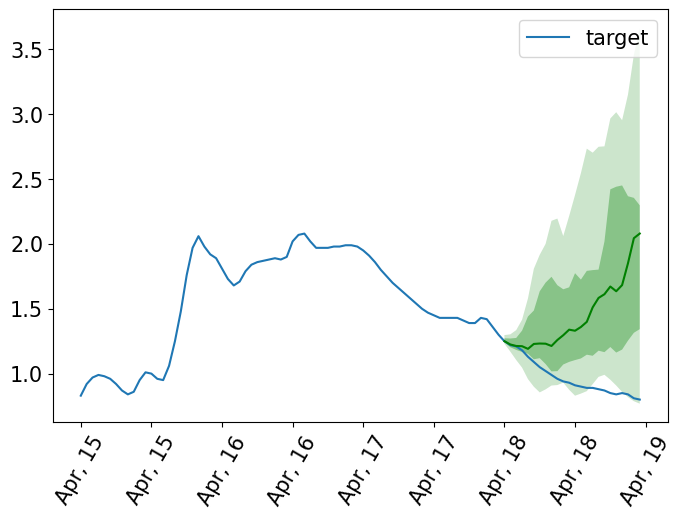

In [ ]:
plt.figure(figsize=(20, 15))
date_formater = mdates.DateFormatter('%b, %d')
plt.rcParams.update({'font.size': 15})

# Iterate through the first 9 series, and plot the predicted samples
for idx, (forecast, ts) in islice(enumerate(zip(forecasts, tss)), 9):
    ax = plt.subplot(3, 3, idx+1)

    plt.plot(ts[-4 * prediction_length:].to_timestamp(), label="target", )
    forecast.plot( color='g')
    plt.xticks(rotation=60)
    ax.xaxis.set_major_formatter(date_formater)
    ax.set_title(forecast.item_id)

plt.gcf().tight_layout()
plt.legend()
plt.show()